In [1]:
from os.path import dirname, join as pjoin
import scipy.io as sio
from scipy.linalg import solve
from scipy.spatial import Delaunay
import plotly.figure_factory as ff
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt
from matplotlib import cm, colors

# Translated libs
from meshlib import *
from rwglib import *

#
from my_generalized_eigen_problem import *

# Creating mesh

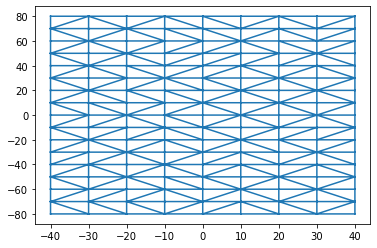

In [2]:
hull_bound_points = np.array([[-10,-20],[10,-20],[-10,20],[10,20]])*4
mesh_resolution = 10
tri = creatHull(hull_bound_points,mesh_resolution)
plt.triplot(tri.points[:,0], tri.points[:,1], tri.simplices)
plt.show()

## Save to "p" and "t"

In [3]:
p = np.zeros((3,tri.points.shape[0]))
p[0:2,:] = tri.points.T/1000
t = np.ones((4,tri.simplices.shape[0]))
t[0:3,:] = tri.simplices.T + 1
t = t.astype(int)

# RWG1 Geometry calculations - all Chapters
Uses the structure mesh file, e.g. platefine.mat, as an input.

Creates the RWG edge element for every inner edge of the structure. The total number of elements is EdgesTotal.

Outputs the following arrays:

Edge first node number          

    Edge_(1,1:EdgesTotal)
   
Edge second node number  

    Edge_(2,1:EdgesTotal)
    
Plus triangle number  

    TrianglePlus(1:EdgesTotal)
   
Minus triangle number           

    TriangleMinus(1:EdgesTotal)
   
Edge length                     

    EdgeLength(1:EdgesTotal)
   
Edge element indicator          
    
    EdgeIndicator(1:EdgesTotal)

Also outputs areas and midpoints of separate triangles:

Triangle area                   

    Area(1:TrianglesTotal)
   
Triangle center                 

    Center(1:TrianglesTotal)      
   
This script may handle surfaces with T-junctions including monopoles over various metal surfaces and certain metal meshes

Copyright 2002 AEMM. Revision 2002/03/09 Chapter 2


Plot the mesh

In [4]:
x_,y_,z_ = p
fig_scale = max(max(x_)-min(x_),max(y_)-min(y_),max(z_)-min(z_))
x_scale,y_scale,z_scale=(max(x_)-min(x_))/fig_scale,(max(y_)-min(y_))/fig_scale,(max(z_)-min(z_))/fig_scale
fig1 = ff.create_trisurf(x=x_, y=y_, z=z_,
                         simplices=(t[0:3,:].T-1),
                         color_func=[i for i in range(len(t.T))],
                         show_colorbar=False,
                         title="Antenna mesh", aspectratio=dict(x=x_scale, y=y_scale, z=0.3))
fig1.show()

In [5]:
ANT_mesh1 = RWGmesh(p,t)

Total number of triangles is  256
Total number of edges is  360


This block is only meaningful for T junctions. It leaves only two edge elements at a junction

# RWG2: Geometry calculations - all Chapters
Uses the mesh file from RWG1, mesh1.mat, as an input.

Creates the following parameters of the RWG edge elements: 

Position vector rho_c_plus from the free vertex of the "plus" triangle to its center

                                   RHO_Plus(1:3,1:EdgesTotal)
                                   
Position vector rho_c_minus from the center of the "minus" triangle to its free vertex 

                                   RHO_Minus(1:3,1:EdgesTotal)

In addition to these parameters creates the following arrays for nine subtriangles (barycentric subdivision):

Midpoints of nine subtriangles

                                   Center_(1:3,1:9,1:TrianglesTotal)  
                                   
Position vectors rho_c_plus from the free vertex of the "plus" triangle to nine subtriangle midpoints

                                   RHO__Plus(1:3,1:9,1:EdgesTotal)
                                   
Position vectors rho_c_minus from nine subtriangle midpoints to the free vertex of the "minus" triangle

                                   RHO__Minus(1:3,1:9,1:EdgesTotal)

See Rao, Wilton, Glisson, IEEE Trans. Antennas and Propagation, vol. AP-30, No 3, pp. 409-418, 1982.

Copyright 2002 AEMM. Revision 2002/03/05 
Chapter 2

In [6]:
ANT_mesh2 = RWGmesh2(ANT_mesh1,t,p)

# RWG3 Calculates the impedance matrix using function IMPMET
   Uses the mesh file from RWG2, mesh2.mat, as an input.

The following parameters need to be specified prior to calculations:

    Frequency (Hz)                  f

    Dielectric constant (SI)        epsilon_

    Magnetic permeability (SI)      mu_

Copyright 2002 AEMM. Revision 2002/03/11 
Chapter 2

In [7]:
frequency          = 1e9
epsilon_    = 8.854e-012
mu_         = 1.257e-006
c_=1/np.sqrt(epsilon_*mu_)
eta_=np.sqrt(mu_/epsilon_)

In [8]:
omega       =2*np.pi*frequency                                      
k           =omega/c_
K           =1j*k
Constant1   =mu_/(4*np.pi)
Constant2   =1/(1j*4*np.pi*omega*epsilon_)
Factor      =1/9
FactorA     =Factor*(1j*omega*ANT_mesh1.EdgeLength/4)*Constant1
FactorFi    =Factor*ANT_mesh1.EdgeLength*Constant2
FactorA = FactorA[np.newaxis].T
FactorFi = FactorFi[np.newaxis].T

## Calculate impedance matrix

In [9]:
Z = impmet(ANT_mesh1,K,ANT_mesh2,FactorA,FactorFi)

# RWG5 Visualizes the surface current magnitude 

Matrix form of the Charateristic Mode decomposition is

$$
  ZI_n = (1 + j\lambda_n)RI_n
$$

or

$$
  XI_n = \lambda_nRI_n
$$

where $Z = R + jX$. We have to solve an generalized eigenvalue problem here where $\lambda_n$ is an eigenvalue coresponding to eigenvector $I_n$.

Assign the Real and Imaginary maxtrices from the Impedance matrix


In [10]:
R = np.real(Z)
X = np.imag(Z)

In [11]:
v, w = My_generalized_eigen_problem(X,R).solve()

C:\Users\quang\Documents\GitHub\MoMPython_KN\my_generalized_eigen_problem.py:16: RuntimeWarning:

invalid value encountered in sqrt



Filter all useful modes those are of low magnitude eigenvalues

In [12]:
N = 4 # Number of modes to look at
w = np.diag(w)
w_abs = np.abs(w)
ind = np.argsort(w_abs, axis=0)
w = w[ind[:N]]
v = v.T[ind[:N]]

## Calculate surface currents

The most useful Characteristic Modes are the lowest. Hence, we will try to check the surface currents of those modes with the smallest eigenvalues. The $numpy.linalg.eig()$ function gives eigenvalues in a descending order, so we need to check the last elements of $w$

In [13]:
for i in range(len(w)):
    print('Characteristic mode number',i+1)
    print('Eigenvalue conresponding',w[i])
    I = v[i]
    SCurrent = currentDistribution(t,ANT_mesh1,ANT_mesh2,I)
    Jmax = max(SCurrent)
    CurrentNorm = SCurrent/max(SCurrent)
    fig = ff.create_trisurf(x=x_, y=y_, z=z_,
                             simplices=(t[0:3,:].T-1),
                             color_func=list(CurrentNorm),
                             show_colorbar=True,
                             title="Antenna mesh - Normalized current distribution of mode " + str(i+1), aspectratio=dict(x=x_scale, y=y_scale, z=0.3))
    fig.show()

Characteristic mode number 1
Eigenvalue conresponding 0.30595532664872926
Current vector's size (256,)


Characteristic mode number 2
Eigenvalue conresponding -2.4624265306052364
Current vector's size (256,)


Characteristic mode number 3
Eigenvalue conresponding 6.179081960738786
Current vector's size (256,)


Characteristic mode number 4
Eigenvalue conresponding -10.474800187299481
Current vector's size (256,)


# EFIELD3 2D Radiation patterns

Uses the mesh file from RWG2, mesh2.mat, and the file containing surface current coefficients, current.mat, from RWG4 as inputs.

Additionally uses the value of TotalPower saved  in file gainpower.mat (script efield2.m)

The following parameters need to be specified:

    Radius of the circle (m)            R
    Plane of the circle:                [x y 0] or 
                                        [x 0 z] or 
                                        [0 y z] 
Number of discretization points per pattern                             

                                        NumPoints

Copyright 2002 AEMM. Revision 2002/03/11 

Chapter 3

In [14]:
mat_fname_sphere = pjoin('mesh', 'sphere_dense.mat')
print(mat_fname_sphere)
mat_contents_sphere = sio.loadmat(mat_fname_sphere)
p_sphere = mat_contents_sphere['p']
t_sphere = mat_contents_sphere['t']
p_sphere=100*p_sphere

mesh\sphere_dense.mat


In [15]:
K=1j*(2*np.pi*frequency/c_)

Preparing Phi and scan Theta to have 2D pattern

In [16]:
NumPoints = 100
R = 1000 # meter - distance to the antenna
theta = np.array([2*np.pi*(ii)/(NumPoints -1) for ii in range(NumPoints)])
phi = 0*np.pi
ObservationPointList_phi0 = [np.array([R*np.sin(theta_)*np.cos(phi), R*np.sin(theta_)*np.sin(phi), R*np.cos(theta_)]) for theta_ in theta]
phi = 0.5*np.pi
ObservationPointList_phi90 = [np.array([R*np.sin(theta_)*np.cos(phi), R*np.sin(theta_)*np.sin(phi), R*np.cos(theta_)]) for theta_ in theta]

Preparing Phi and scan Theta to have 3D pattern

In [17]:
theta_ = (np.arange(NumPoints)/(NumPoints-1))*np.pi
phi_ = (-1/2 + np.arange(NumPoints)/(NumPoints-1))*np.pi*2
Theta, Phi = np.meshgrid(theta_,phi_)

Characteristic mode number 1
Eigenvalue conresponding 0.30595532664872926
Maximum E-field gain:  2.836772654081777 dBi


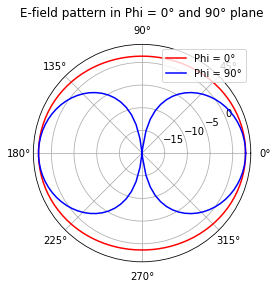

Characteristic mode number 2
Eigenvalue conresponding -2.4624265306052364
Maximum E-field gain:  4.206309721131013 dBi


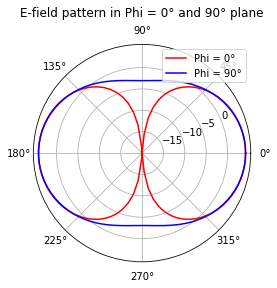

Characteristic mode number 3
Eigenvalue conresponding 6.179081960738786
Maximum E-field gain:  3.897190469686917 dBi


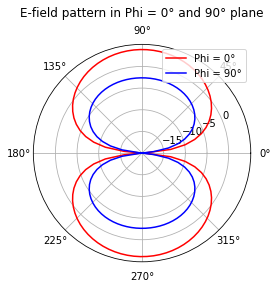

Characteristic mode number 4
Eigenvalue conresponding -10.474800187299481
Maximum E-field gain:  4.067061128433084 dBi


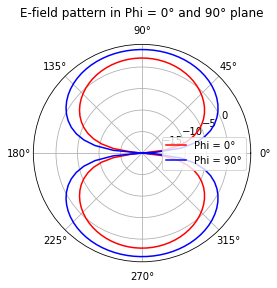

In [18]:
for i in range(len(w)):
    print('Characteristic mode number',i+1)
    print('Eigenvalue conresponding',w[i])
    I = v[i]
    ANT_moment = RWGmoment(ANT_mesh1,I)
    U, TotalPower = radiating3DPower(t_sphere,p_sphere,ANT_moment,K,eta_)
    print("Maximum E-field gain: ",10*np.log10(4*np.pi*max(U)/TotalPower),"dBi")
    U_norm = 10*np.log10(4*np.pi*U/TotalPower)

    #Field calculation
    U_efield3_phi0, W_efield3_phi0 = radiating2DFields(ObservationPointList_phi0,ANT_moment,K,eta_)
    U_efield3_phi90, W_efield3_phi90 = radiating2DFields(ObservationPointList_phi90,ANT_moment,K,eta_)
    # Plotting 3D Pattern
    Polar_0 = 10*np.log10(4*np.pi*U_efield3_phi0/TotalPower)
    Polar_90 = 10*np.log10(4*np.pi*U_efield3_phi90/TotalPower)
    OFFSET = -20
    fig4, ax = plt.subplots(subplot_kw={'projection': 'polar'})
    ax.plot(theta, np.where(Polar_0 < OFFSET, OFFSET, Polar_0), color='red', label='Phi = 0°')
    ax.plot(theta, np.where(Polar_90 < OFFSET, OFFSET, Polar_90), color='blue', label='Phi = 90°')
    ax.legend()
    ax.set_rmin(OFFSET)
    ax.set_rticks([-15, -10, -5, 0])  # Less radial ticks
    #ax.set_rlabel_position(-22.5)  # Move radial labels away from plotted line
    ax.grid(True)

    ax.set_title("E-field pattern in Phi = 0° and 90° plane", va='bottom')
    plt.show()
    
    ## Plotting 3D Pattern
    U_points = radiating3DPower_updateSphere(t_sphere,p_sphere,ANT_moment,K,eta_)
    U_points_dB = 10*np.log10(4*np.pi*U_points/TotalPower)
    Th = max(U_points_dB) - 20 #dynamic range of 20dB
    U_points_dB = np.array([max(U_points_dB[i]-Th,0.01) for i in range(p_sphere.shape[1])])
    # If in dB
    p_sphere_update = U_points_dB*p_sphere/1000
    # If in linear scale
    #p_sphere_update = U_points*p_sphere/1000
    x_sphere,y_sphere,z_sphere = p_sphere_update
    fig_scale_sphere = max(max(x_sphere)-min(x_sphere),max(y_sphere)-min(y_sphere),max(z_sphere)-min(z_sphere))
    x_scale_sphere,y_scale_sphere,z_scale_sphere=(max(x_sphere)-min(x_sphere))/fig_scale_sphere,(max(y_sphere)-min(y_sphere))/fig_scale_sphere,(max(z_sphere)-min(z_sphere))/fig_scale_sphere
    fig3 = ff.create_trisurf(x=x_sphere, y=y_sphere, z=z_sphere,
                             simplices=(t_sphere[0:3,:].T-1),
                             colormap="Rainbow",
                             plot_edges=False,
                             color_func=U_norm,
                             show_colorbar=True,
                             title="Radiation Pattern", 
                             aspectratio=dict(x=x_scale_sphere, y=y_scale_sphere, z=z_scale_sphere))
    fig3.show()